In [1]:
import os
import requests
import pandas as pd
import glob
import matplotlib.patches as mpatches
import imageio
from PIL import Image

# from geopy.geocoders import Nominatim
# from geopy.extra.rate_limiter import RateLimiter

# from tqdm.auto import tqdm
# from tqdm._tqdm_notebook import tqdm_notebook

import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

get_ipython().run_line_magic('matplotlib', 'inline')


import mpl_toolkits.basemap
import numpy

import scipy.stats
import seaborn
import sklearn.model_selection
import sklearn.neighbors
import math
seaborn.set()

In [2]:
def swap(csv_pr, a, b):
    for i in range (a, b):
        tmp = csv_pr[i]
        csv_pr[i] = csv_pr[i+1]
        csv_pr[i+1] = tmp
    return csv_pr

In [3]:
csv_pr = glob.glob('data\\us\\*.{}'.format('csv'))

csv_pr = swap(csv_pr, 0, 1)
csv_pr = swap(csv_pr, 2, 7)        
csv_pr

['data\\us\\Earthquake_2020_9_2020_10_filtered.csv',
 'data\\us\\Earthquake_2020_11_2020_12_filtered.csv',
 'data\\us\\Earthquake_2021_1_2021_2_filtered.csv',
 'data\\us\\Earthquake_2021_3_2021_4_filtered.csv',
 'data\\us\\Earthquake_2021_5_2021_6_filtered.csv',
 'data\\us\\Earthquake_2021_7_2021_8_filtered.csv',
 'data\\us\\Earthquake_2021_9_2021_10_filtered.csv',
 'data\\us\\Earthquake_2021_11_2021_12_filtered.csv',
 'data\\us\\Earthquake_2022_1_2022_2_filtered.csv',
 'data\\us\\Earthquake_2022_3_2022_4_filtered.csv',
 'data\\us\\Earthquake_2022_5_2022_6_filtered.csv',
 'data\\us\\Earthquake_2022_7_2022_8_filtered.csv']

In [4]:
df_plot_1 = pd.read_csv("data\\us\\Earthquake_2020_9_2020_10_filtered.csv")
df_plot_1.head()

,time,latitude,longitude,depth,mag
0,2020-09-01T00:30:52.227Z,38.176500,-117.8019,6.70,3.50
1,2020-09-01T00:36:59.811Z,38.003900,-118.2358,6.60,3.40
2,2020-09-01T01:39:34.960Z,36.394333,-120.4370,9.19,2.87
3,2020-09-01T02:25:49.130Z,42.370000,-118.4440,8.45,3.52
4,2020-09-01T05:51:36.757Z,38.179800,-117.8634,9.20,3.30


In [5]:
def get_lon_lat_range(csv_pr):
    min_lon = 999
    min_lat = 999
    max_lon = -999
    max_lat = -999

    for files in csv_pr:
        df_tmp = pd.read_csv(files)
        min_lon = min(min_lon, min(df_tmp['longitude']))
        min_lat = min(min_lat, min(df_tmp['latitude']))
        max_lon = max(max_lon, max(df_tmp['longitude']))
        max_lat = max(max_lat, max(df_tmp['latitude']))

    min_lon = math.floor(min_lon)
    max_lon = math.floor(max_lon)
    min_lat = math.floor(min_lat)
    max_lat = math.floor(max_lat)

    print(min_lon)
    print(max_lon)
    print(min_lat)
    print(max_lat)
    return [min_lon, max_lon, min_lat, max_lat]

In [6]:
min_lon, max_lon, min_lat, max_lat = get_lon_lat_range(csv_pr)

-125
-68
28
48


In [7]:
def get_grid (csv_pr, shape, min_lon):
    grid_lon = numpy.zeros(99)
    grid_lat = numpy.zeros(99) 
    grid = numpy.zeros(99)

    xlist = []
    ylist = []
    zlist = numpy.zeros(shape)

    for i in range (shape-1):
        tmp = numpy.zeros(shape)
        zlist = numpy.vstack([zlist, tmp])
        
    for i in range (98):
        tmp = numpy.zeros(99)
        grid = numpy.vstack([grid,tmp]) 

    for files in csv_pr:
        df_tmp = pd.read_csv(files)
        lon_list = df_tmp['longitude']
        lat_list = df_tmp['latitude']
        xlist = xlist + list(lon_list)
        ylist = ylist + list(lat_list)
        for j in range (len(lon_list)):
            lon = lon_list[j]
            lat = lat_list[j]
            grid_lon[math.floor(lon-min_lon)] += 1
            grid_lat[math.floor(lat)] += 1
            grid[math.floor(lon-min_lon)][math.floor(lat)] += 1
    return [grid_lon, grid_lat, grid, xlist, ylist, zlist]

In [8]:
grid_lon, grid_lat, grid, xlist, ylist, zlist = get_grid(csv_pr, 5762, min_lon)

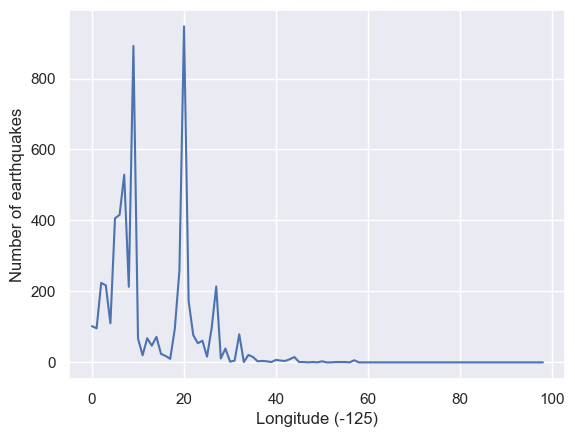

In [9]:
plt.plot(grid_lon)
plt.xlabel('Longitude (-{})'.format(math.floor(-min_lon)))
plt.ylabel('Number of earthquakes')
plt.show()

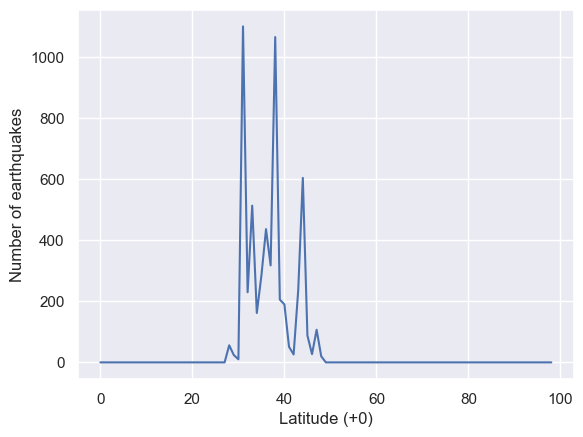

In [10]:
plt.plot(grid_lat)
plt.xlabel('Latitude (+0)')
plt.ylabel('Number of earthquakes')
plt.show()

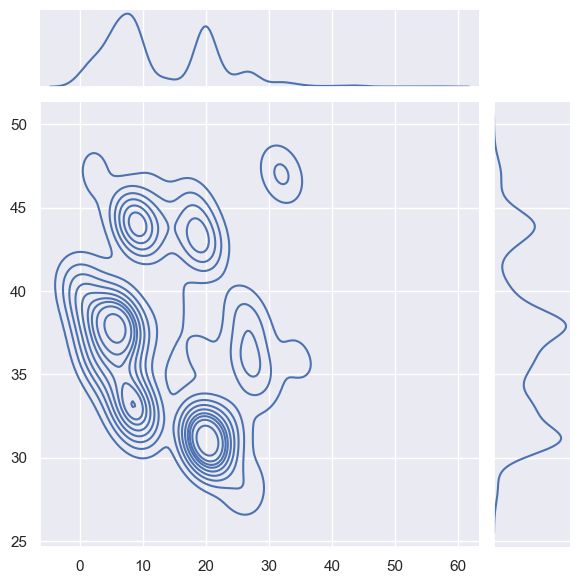

In [11]:
#initiate
y1 = numpy.array([])
y2 = numpy.array([])
grid = numpy.array(grid)

#create locations
for i in range(1,int(grid.max()+1)):
    for j in range(i):
        locs = numpy.where(grid==i)
        try:
            y1 = numpy.append(y1, locs[0])
            y2 = numpy.append(y2, locs[1])
        except: #this number doesn't exist in the array
            break

seaborn.jointplot(x=y1, y=y2, kind="kde")

In [15]:
def get_threshold_US():
    d1 = 30
    d2 = 5
    return [d1, d2]

In [16]:
def get_threshold_EU():
    d1 = 80
    d2 = 35
    return [d1, d2]

In [17]:
def get_all_merged (csv_pr, cont, min_lon):
    all_merged = []
    
    if (cont == "US"):
        d1, d2 = get_threshold_US()
    else:
        d1, d2 = get_threshold_EU()
    for files in csv_pr:
        df_plot_all = pd.read_csv(files)
        df_large = df_plot_all[['latitude', 'longitude']]

        grids = numpy.zeros(99)
        merged = numpy.zeros(99)

        for i in range (98):
            tmp = numpy.zeros(99)
            grids = numpy.vstack([grids,tmp])    
            merged = numpy.vstack([merged,tmp])    


        lon_list = df_plot_all['longitude']
        lat_list = df_plot_all['latitude']


        for j in range (len(lon_list)):
            lon = lon_list[j]
            lat = lat_list[j]
            grids[math.floor(lon-min_lon)][math.floor(lat)] += 1

        m = 0
        for i in range(1, len(grids)-1):
            for j in range(1, len(grids[0])-1): 
                if (grids[i][j] > m):
                    m = grids[i][j]

        threshold1 = math.floor(m/100*d1)
        threshold2 = math.floor(m/100*d2)
        print(m,threshold1,threshold2)

        for i in range(1, len(grids)):
            for j in range(1, len(grids[0])): 
                if (grids[i][j] >= threshold1):
                    merged[i][j] = 2
                elif (grids[i][j] >= threshold2):
                    merged[i][j] = 1

        all_merged.append(merged)
    return all_merged

In [18]:
all_merged = get_all_merged(csv_pr, "US", min_lon)

196.0 58 9
111.0 33 5
50.0 15 2
75.0 22 3
137.0 41 6
259.0 77 12
106.0 31 5
78.0 23 3
84.0 25 4
102.0 30 5
100.0 30 5
105.0 31 5


In [19]:
all_merged[1][1]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [20]:
def create_empty():
    res = numpy.zeros(99)
    for x in range (98):
        tmp = numpy.zeros(99)
        res = numpy.vstack([res, tmp])
    return res

In [21]:
def getXYZ(xlist, ylist, zlist, hotspots, min_lon):
    xlist = numpy.sort(xlist)
    ylist = numpy.sort(ylist)
    X, Y = numpy.meshgrid(xlist, ylist)
    Z = zlist
    
    for i in range(len(xlist)):
        for j in range(len(ylist)):
            x = int(float(xlist[i]-min_lon))
            y = int(float(ylist[j]))
            Z[i][j] = int(hotspots[x][y])
    
    return [X,Y,Z]

In [22]:
def create_contour(X, Y, Z, min_lat, max_lat, min_lon, max_lon, cont, contour = 1, no=""):
    # visualize the results
    fig15 = plt.figure(figsize=(15, 10))
    fig15.suptitle(
        """
        Density Estimation:
        Location of Earthquakes within the {}
        """.format(cont), 
        fontsize=16
    )

    the_map = mpl_toolkits.basemap.Basemap(
        projection='cyl',
        llcrnrlat=min_lat-5, urcrnrlat=max_lat+5,
        llcrnrlon=min_lon-5, urcrnrlon=max_lon+5,
        resolution='c'
    )

    if (cont == "US"):
        d1, d2 = get_threshold_US()
    else:
        d1, d2 = get_threshold_EU()
        
    the_map.drawcoastlines(linewidth=1)
    the_map.drawcountries(linewidth=1)
    the_map.drawstates(linewidth=1)

    if (contour):
        cs = plt.contourf(X, Y, Z, cmap=plt.cm.Reds)
        plt.colorbar(ticks=[0, 1, 2], label="Number of Earthquakes\n (2 represents HIGH hotspots(>{}%), 1 represents MEDIUM hotspots(>{}%))".format(d1,d2), orientation="horizontal")

    plt.savefig("output_{}_{}.jpg".format(cont,no))


In [23]:
def create_empty_map(xlist, ylist, zlist, min_lat, max_lat, min_lon, max_lon, cont):
    xlist = numpy.sort(xlist)
    ylist = numpy.sort(ylist)
    X, Y = numpy.meshgrid(xlist, ylist)
    Z = zlist
    
    create_contour(X,Y,Z,min_lat,max_lat,min_lon,max_lon,cont,0,"")

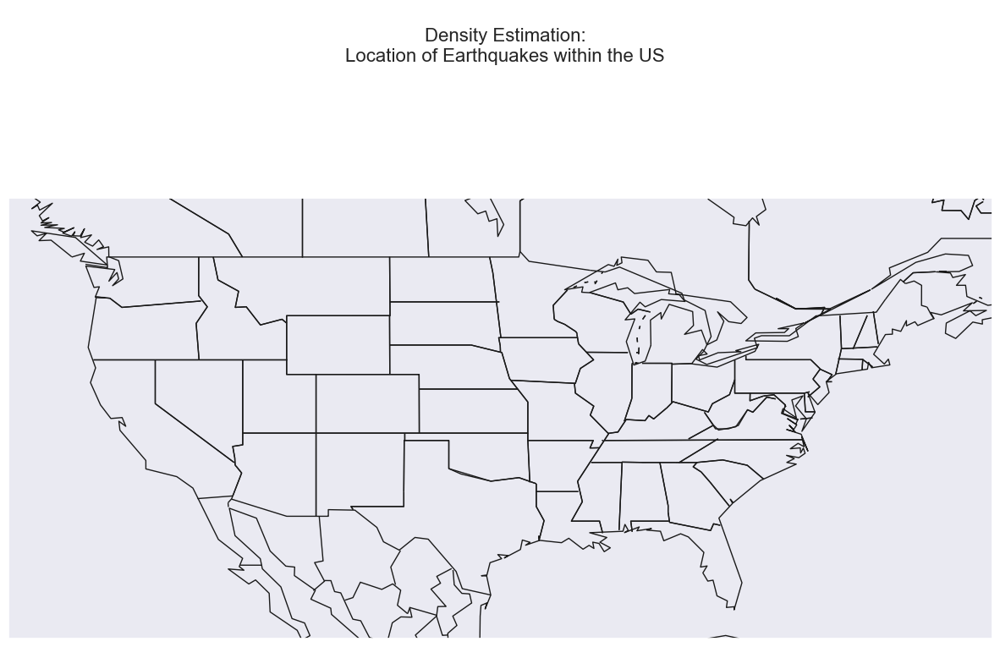

In [24]:
create_empty_map(xlist, ylist, zlist, min_lat, max_lat, min_lon, max_lon, "US")

In [25]:
def create_hotspots_by_batch(num_batch,no_consecutive,xlist,ylist,zlist,all_merged, min_lat, max_lat, min_lon, max_lon, cont):
    
    hotspots = create_empty()
    for k in range(num_batch):
        for i in range (99):
            for j in range (99):
                c1 = 0
                c2 = 0
                for x in range (no_consecutive):
                    if (all_merged[k+x][i][j] == 2):
                        c2 += 1
                    elif (all_merged[k+x][i][j] == 1):
                        c1 += 1
                if (c2 == no_consecutive):
                    hotspots[i][j] = max(hotspots[i][j],2)
                elif (c1 == no_consecutive):    
                    hotspots[i][j] = max(hotspots[i][j],1)
                    
        X,Y,Z = getXYZ(xlist,ylist,zlist,hotspots, min_lon)
        create_contour(X,Y,Z,min_lat, max_lat, min_lon, max_lon,cont,contour=1,no=str(k))
    return hotspots

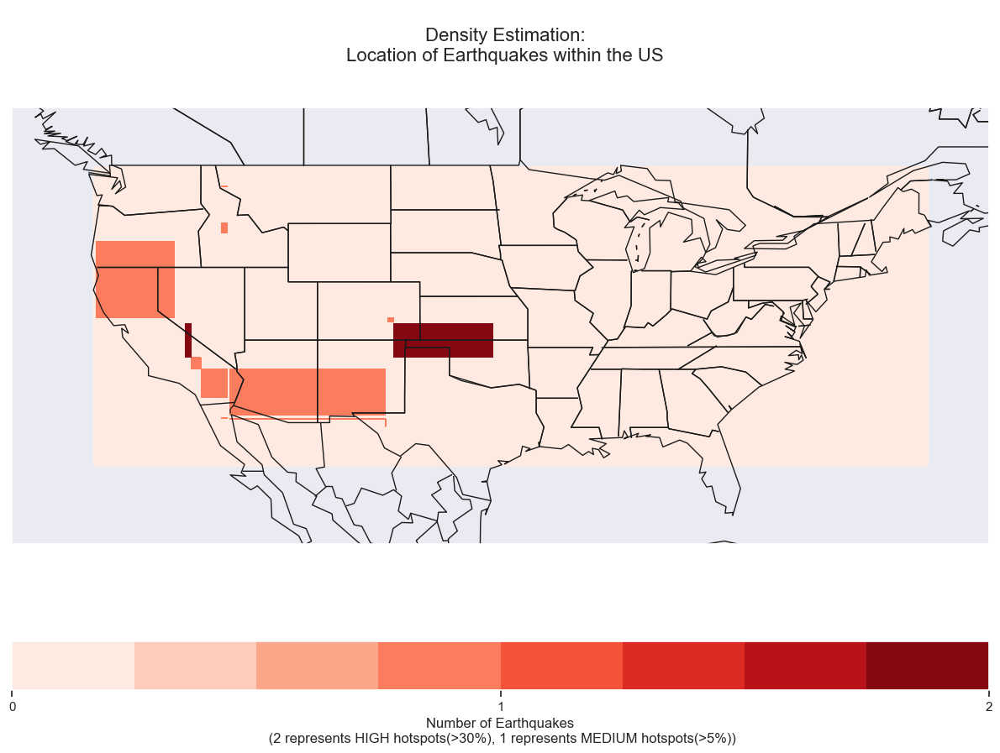

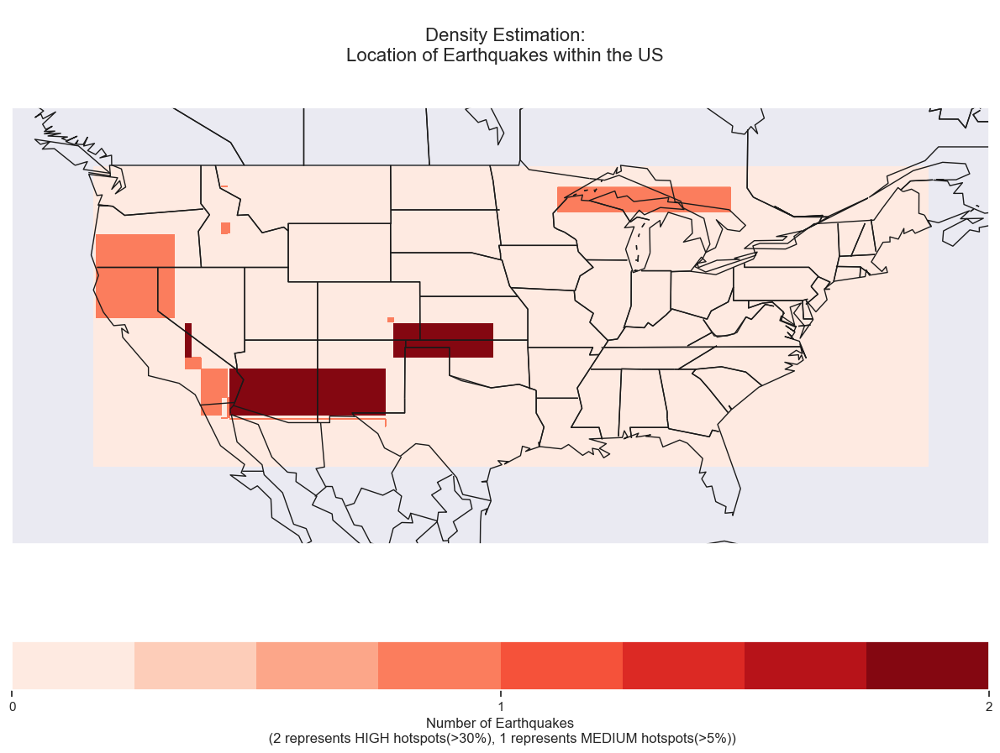

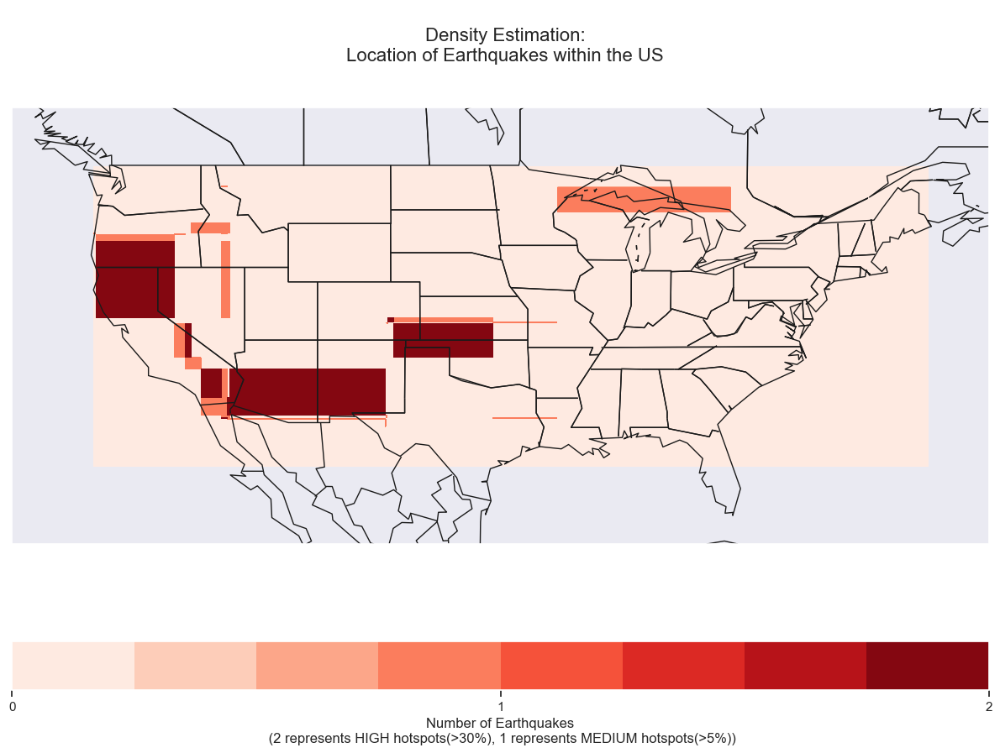

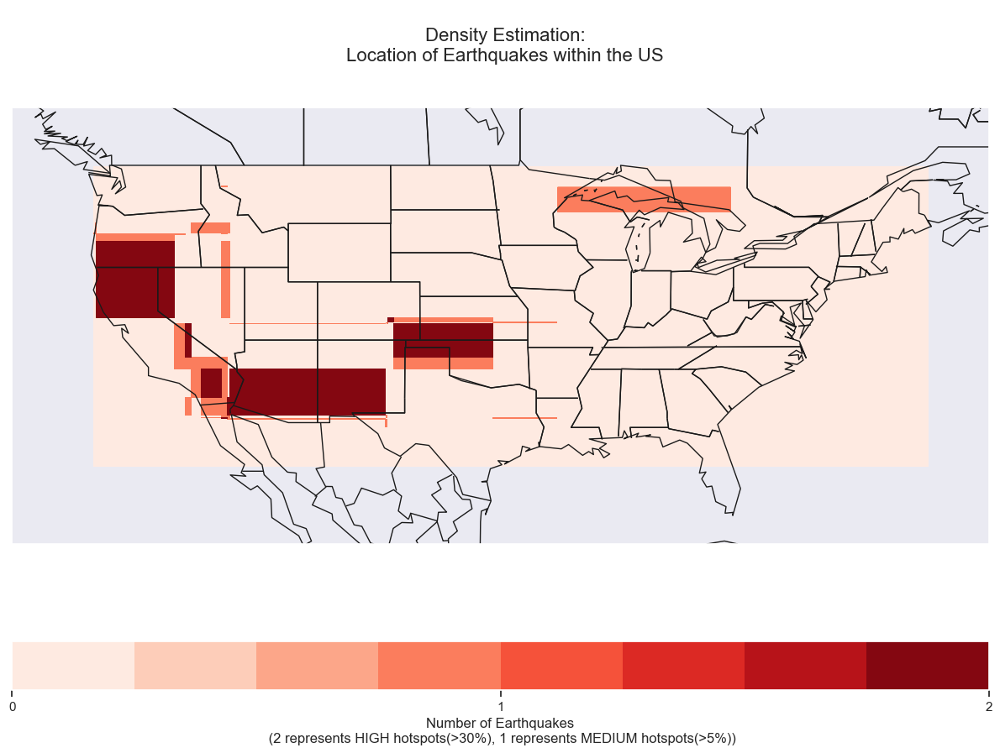

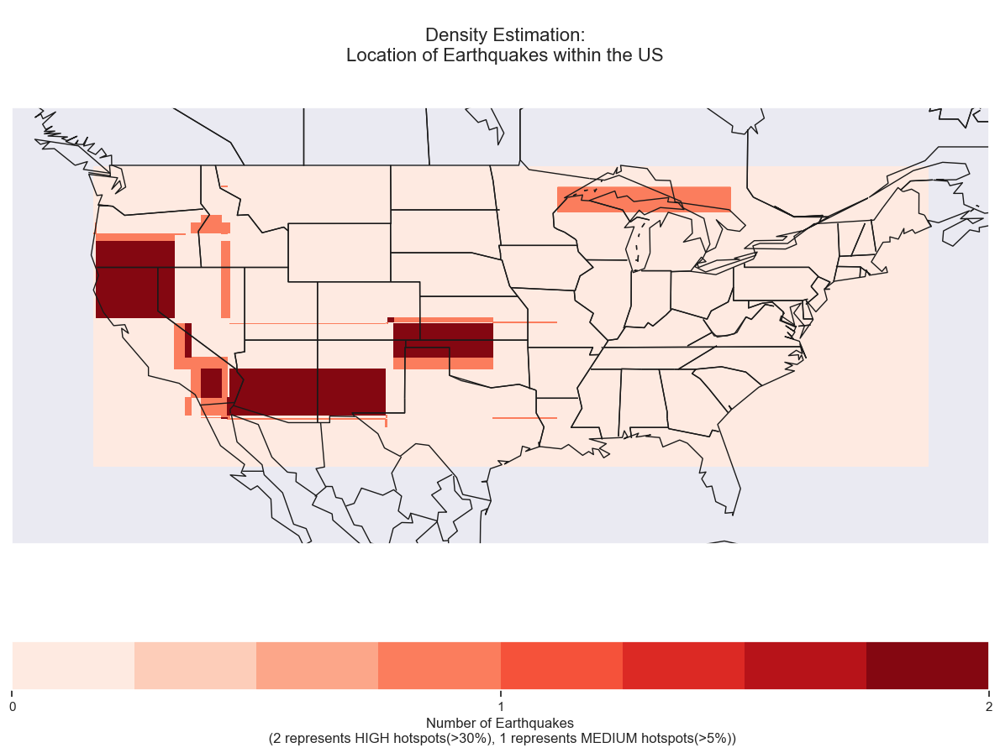

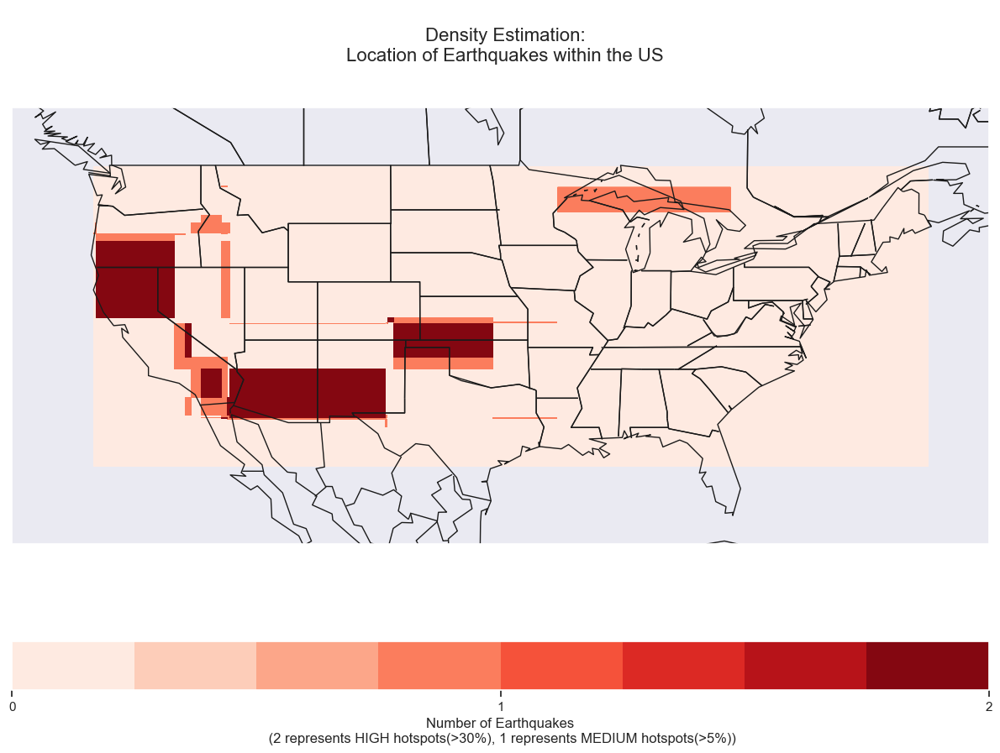

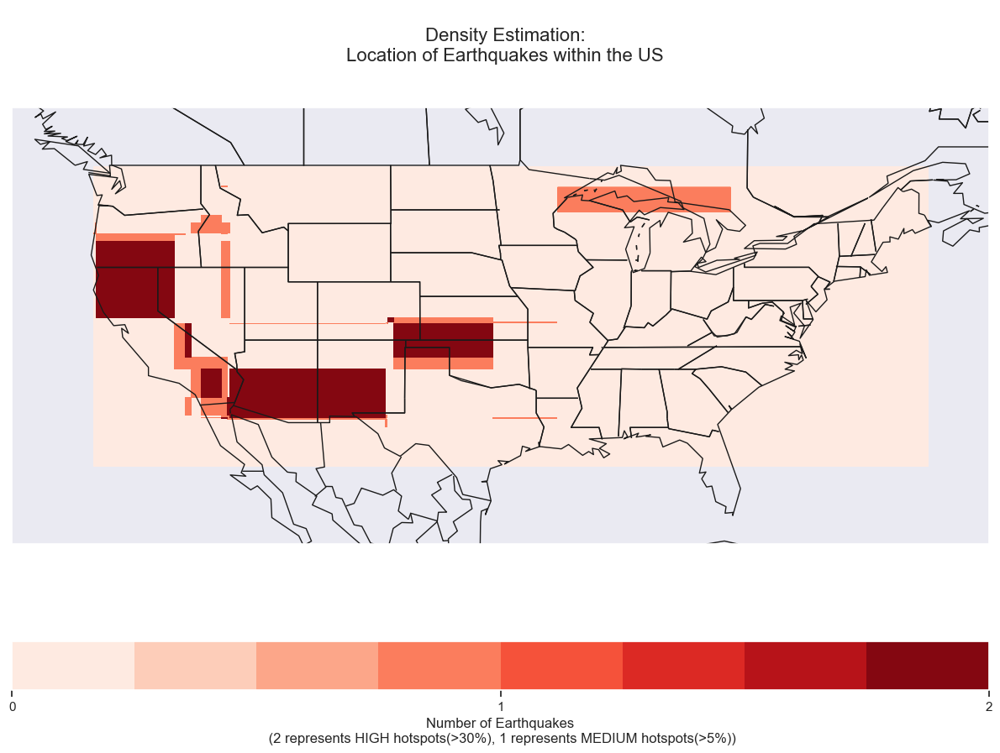

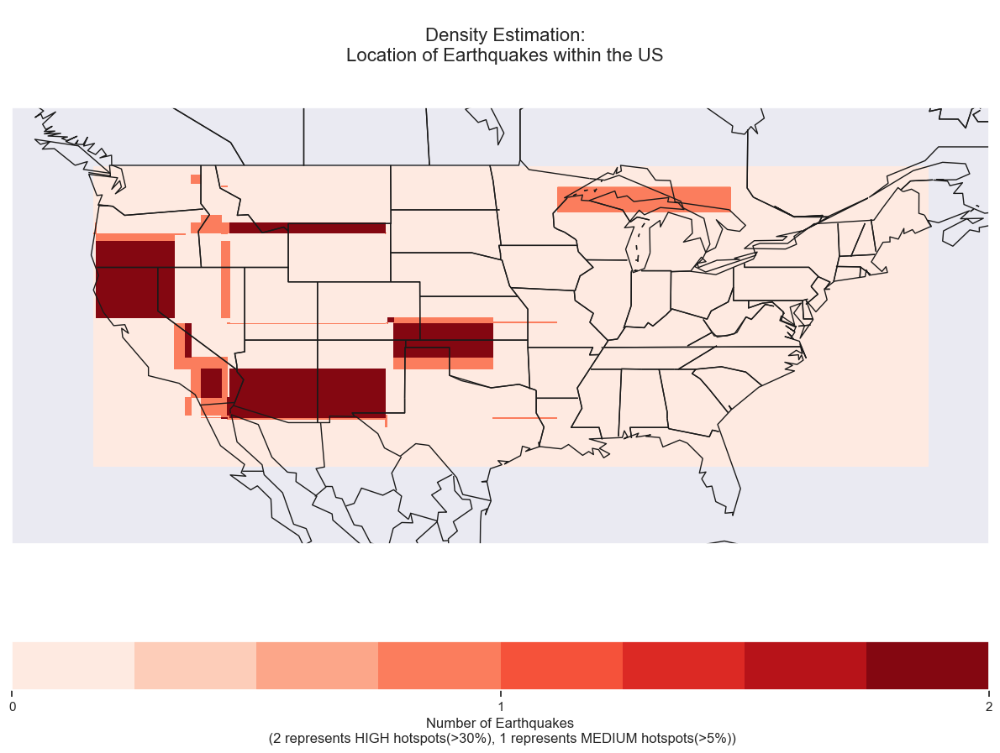

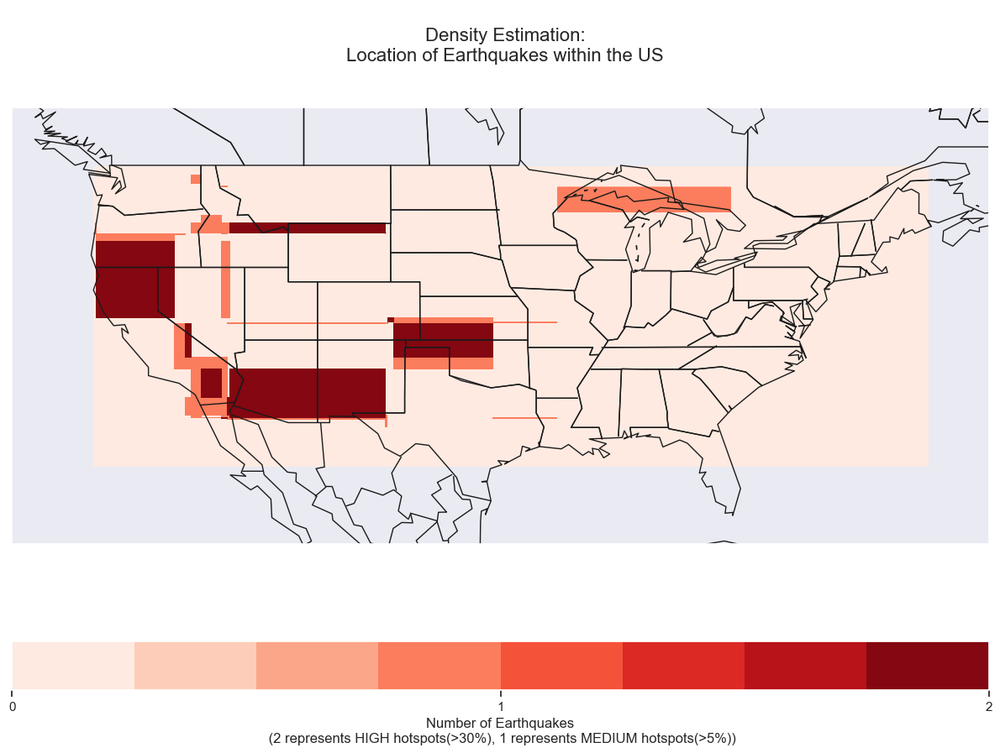

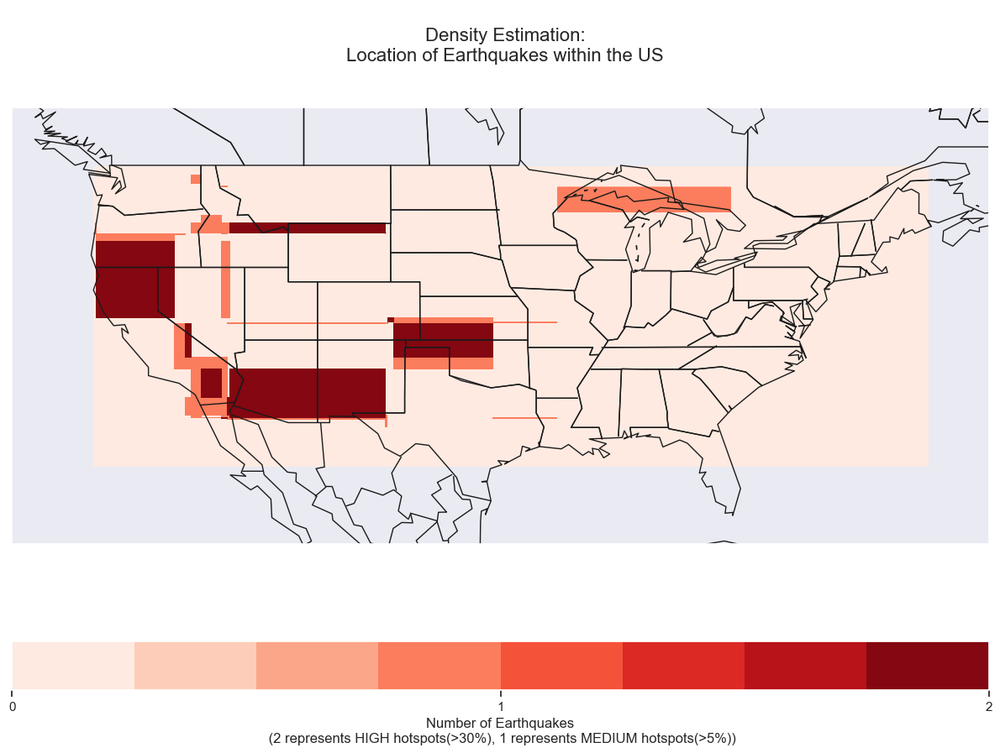

In [31]:
hotspots = create_hotspots_by_batch(10,1,xlist,ylist,zlist,all_merged,min_lat, max_lat, min_lon, max_lon,"US")

In [27]:
def make_gif(fp_in,fp_out,imgs):
    img = next(imgs)  # extract first image from iterator
    img.save(fp=fp_out, format='GIF', append_images=imgs, save_all=True, duration=700, loop=0)
    


In [32]:
# filepaths
fp_in = "output_{}*.jpg".format("US")
fp_out = "animation_{}.gif".format("US")
jpg_pr = glob.glob(fp_in)
    
print(jpg_pr)

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
imgs = (Image.open(f) for f in jpg_pr)

make_gif(fp_in,fp_out,imgs)

['output_US_.jpg', 'output_US_0.jpg', 'output_US_1.jpg', 'output_US_2.jpg', 'output_US_3.jpg', 'output_US_4.jpg', 'output_US_5.jpg', 'output_US_6.jpg', 'output_US_7.jpg', 'output_US_8.jpg', 'output_US_9.jpg']


In [167]:
csv_pr_eu = glob.glob('data\\eu\\*.{}'.format('csv'))

for i in range (3):
    swap(csv_pr_eu, 0, 11)
    
for i in range (3):
    swap(csv_pr_eu, 12, 23)  
    
for i in range (3):
    swap(csv_pr_eu, 24, 35)
    
csv_pr_eu

['data\\eu\\Earthquake_2016_1_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_2_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_3_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_4_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_5_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_6_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_7_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_8_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_9_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_10_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_11_filtered_eu.csv',
 'data\\eu\\Earthquake_2016_12_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_1_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_2_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_3_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_4_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_5_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_6_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_7_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_8_filtered_eu.csv',
 'data\\eu\\Earthquake_2017_9_filtere

In [168]:
min_lon_eu, max_lon_eu, min_lat_eu, max_lat_eu = get_lon_lat_range(csv_pr_eu)

-24
39
35
74


In [169]:
grid_lon_eu, grid_lat_eu, grid_eu, xlist_eu, ylist_eu, zlist_eu = get_grid(csv_pr_eu, 1301, min_lon_eu)

In [170]:
print(grid_eu[20])
print(grid_eu[21])
print(grid_eu[22])
print(grid_eu[23])
print(grid_eu[24])

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 47.
  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 2. 0. 0. 0. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0

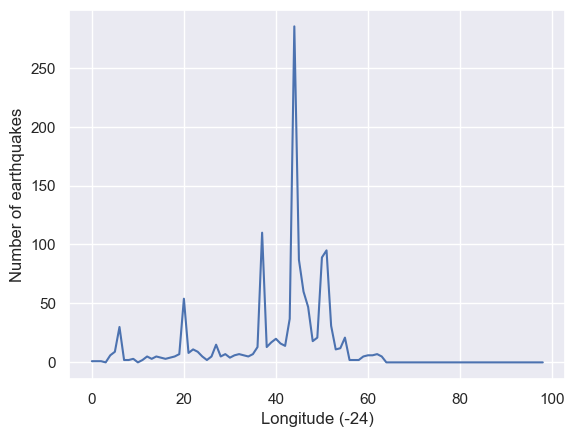

In [171]:
plt.plot(grid_lon_eu)
plt.xlabel('Longitude (-{})'.format(math.floor(-min_lon_eu)))
plt.ylabel('Number of earthquakes')
plt.show()

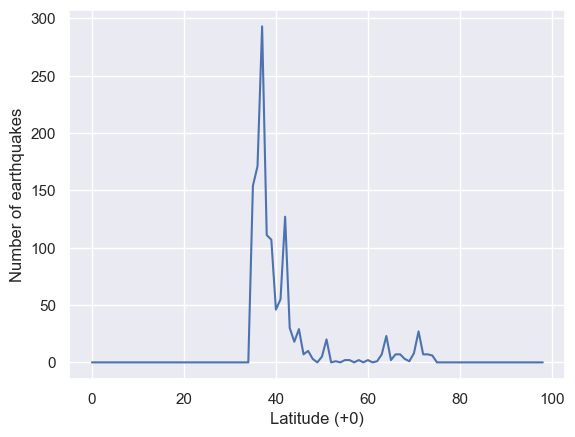

In [172]:
plt.plot(grid_lat_eu)
plt.xlabel('Latitude (+0)')
plt.ylabel('Number of earthquakes')
plt.show()

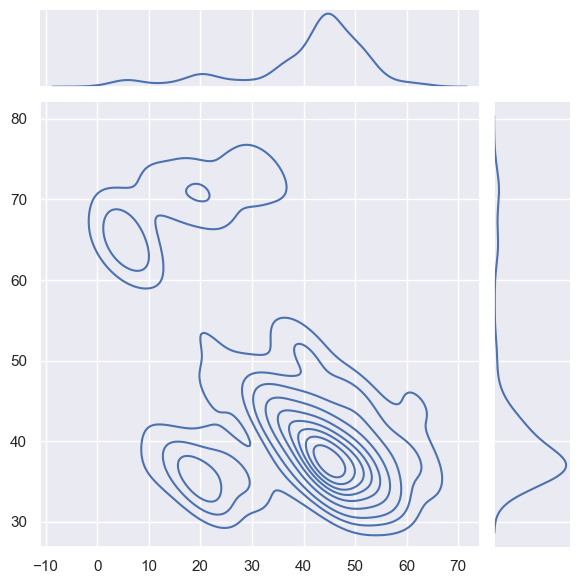

In [173]:
#initiate
y1 = numpy.array([])
y2 = numpy.array([])
grid_eu = numpy.array(grid_eu)

#create locations
for i in range(1,int(grid_eu.max()+1)):
    for j in range(i):
        locs = numpy.where(grid_eu==i)
        try:
            y1 = numpy.append(y1, locs[0])
            y2 = numpy.append(y2, locs[1])
        except: #this number doesn't exist in the array
            break

seaborn.jointplot(x=y1, y=y2, kind="kde")

In [174]:
print(len(grid_eu))

99


In [175]:
all_merged_eu = get_all_merged(csv_pr_eu, "EU", min_lon_eu)

21.0 16 7
10.0 8 3
13.0 10 4
3.0 2 1
6.0 4 2
2.0 1 0
2.0 1 0
25.0 20 8
4.0 3 1
32.0 25 11
8.0 6 2
1.0 0 0
13.0 10 4
17.0 13 5
5.0 4 1
2.0 1 0
8.0 6 2
8.0 6 2
26.0 20 9
8.0 6 2
3.0 2 1
3.0 2 1
2.0 1 0
2.0 1 0
4.0 3 1
7.0 5 2
2.0 1 0
3.0 2 1
3.0 2 1
2.0 1 0
8.0 6 2
3.0 2 1
2.0 1 0
104.0 83 36
73.0 58 25
10.0 8 3


In [176]:
len(all_merged_eu)
#len(all_merged_eu[1])
#for i in range (len(all_merged_eu)):

    #for j in range (len(all_merged_eu[0])):
        #print(all_merged_eu[i][j])

36

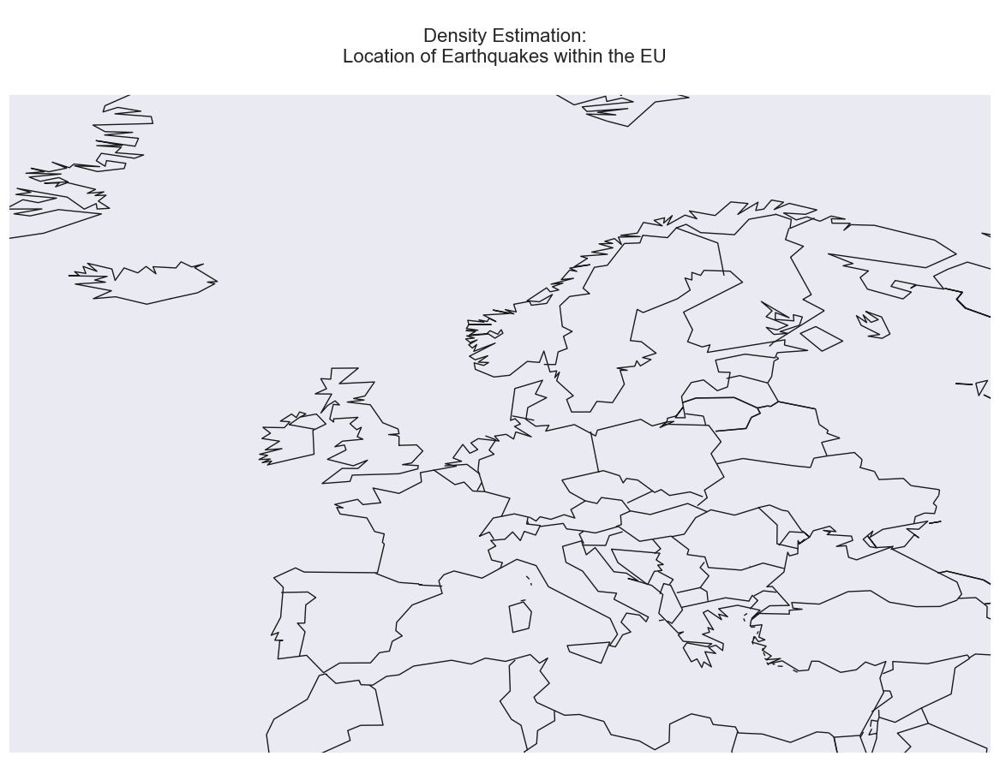

In [177]:
create_empty_map(xlist_eu, ylist_eu, zlist_eu, min_lat_eu, max_lat_eu, min_lon_eu, max_lon_eu, "EU")

C:\Users\jeffr\AppData\Local\Temp\ipykernel_13496\3895630458.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig15 = plt.figure(figsize=(15, 10))


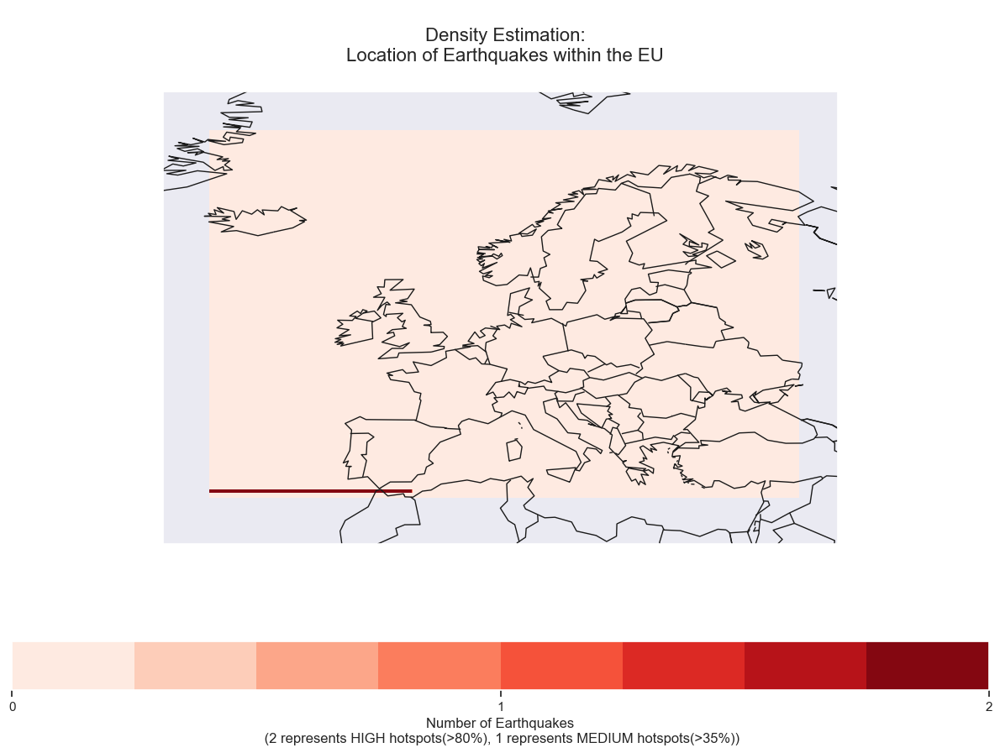

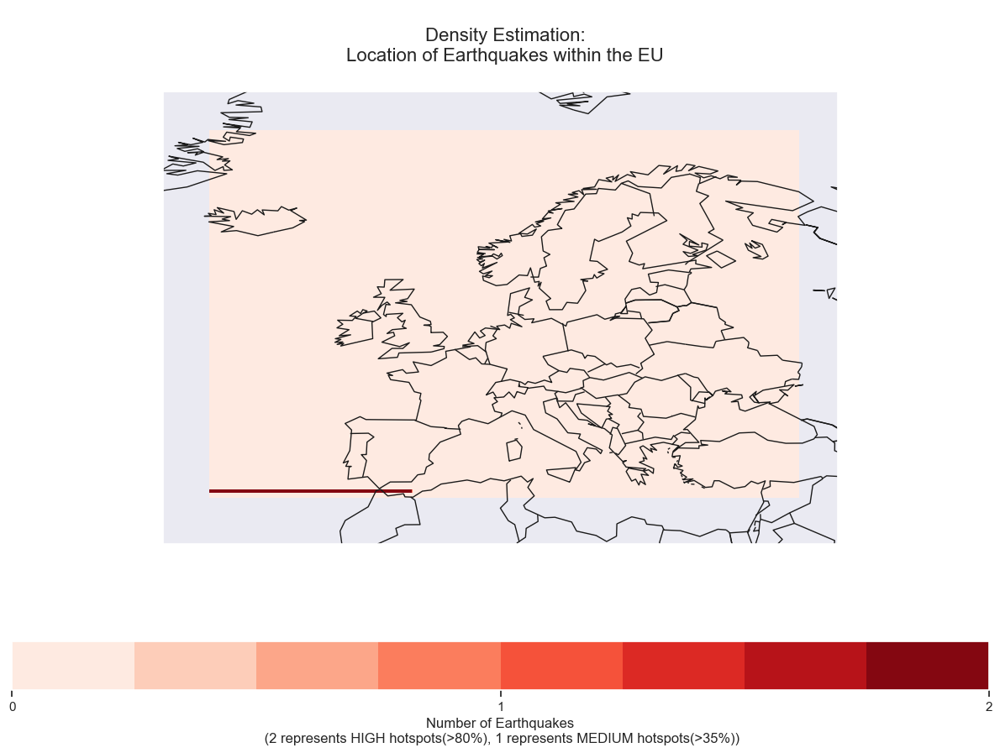

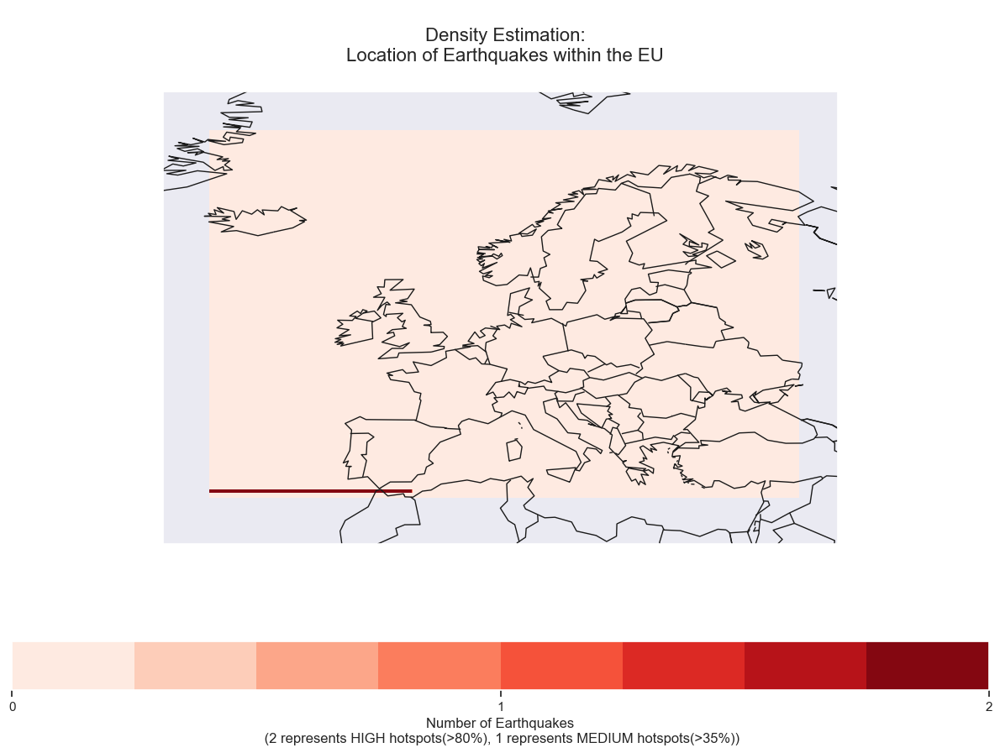

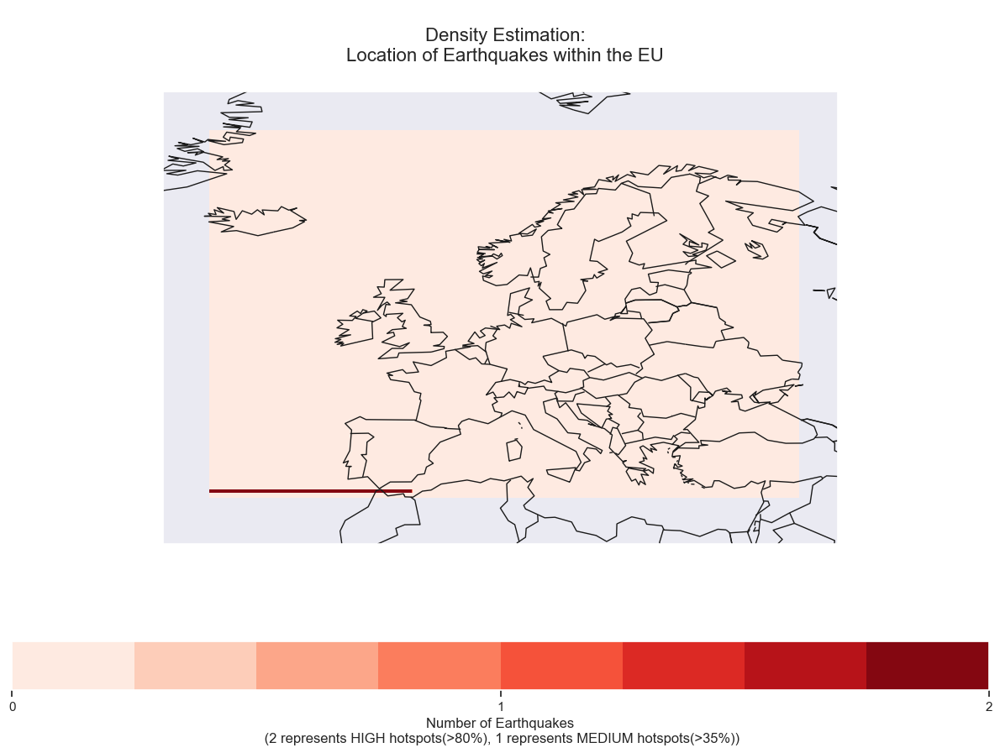

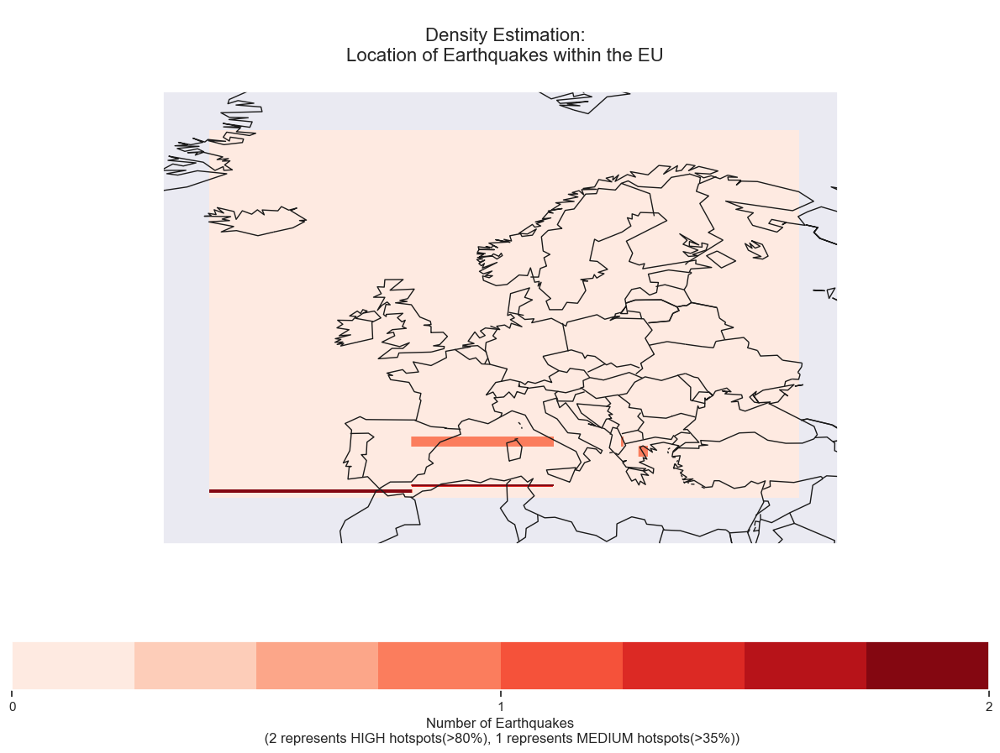

...

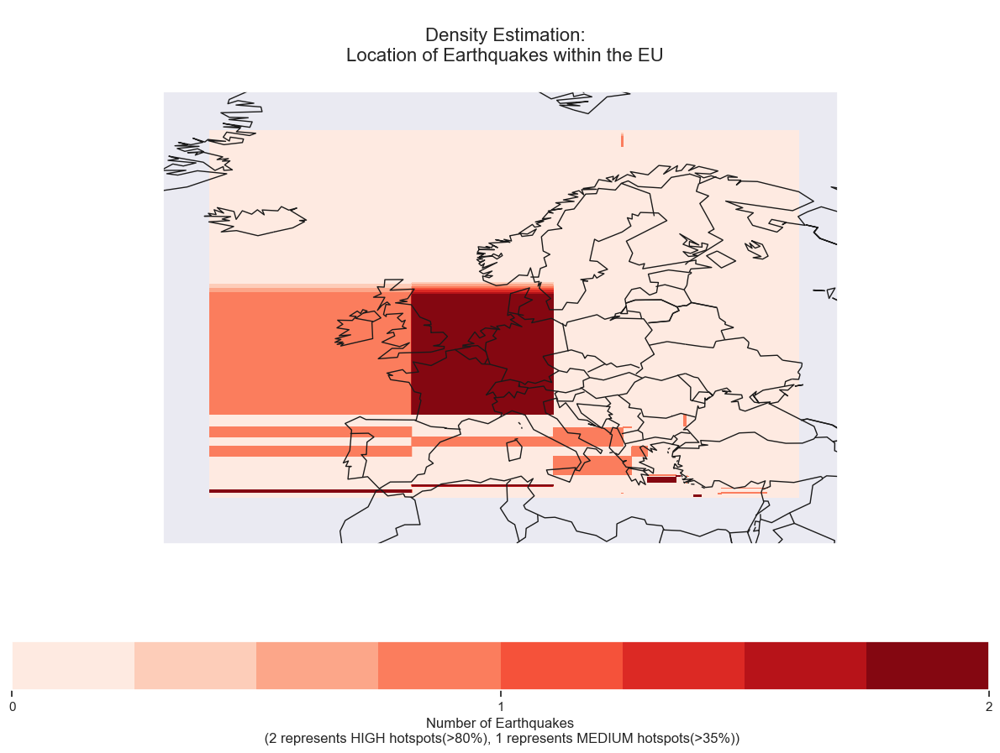

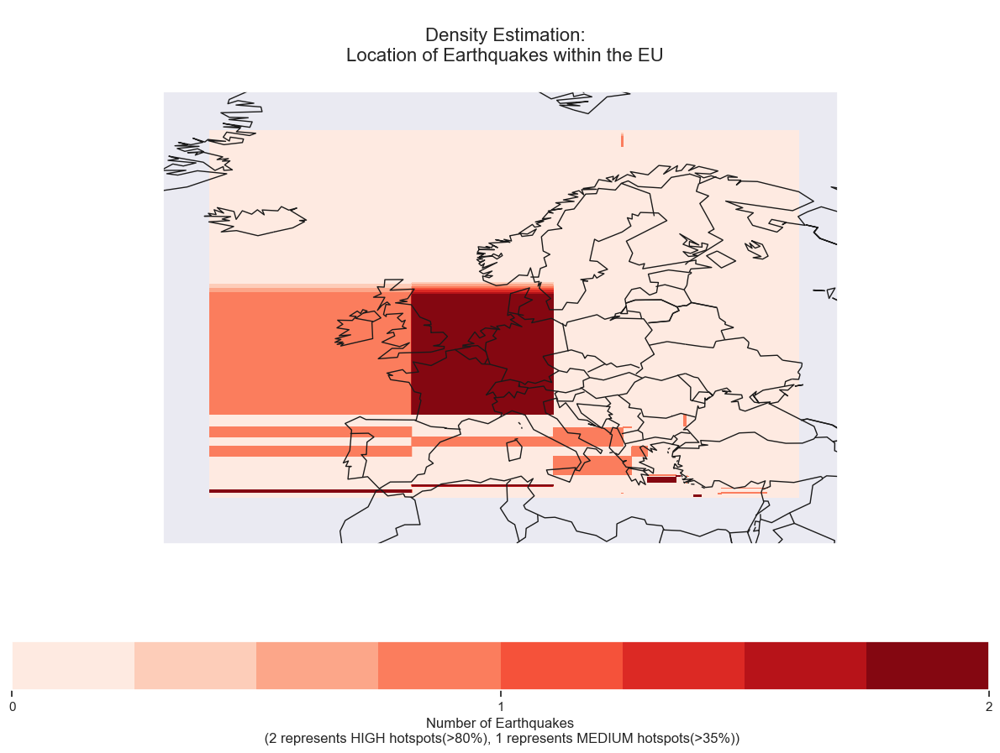

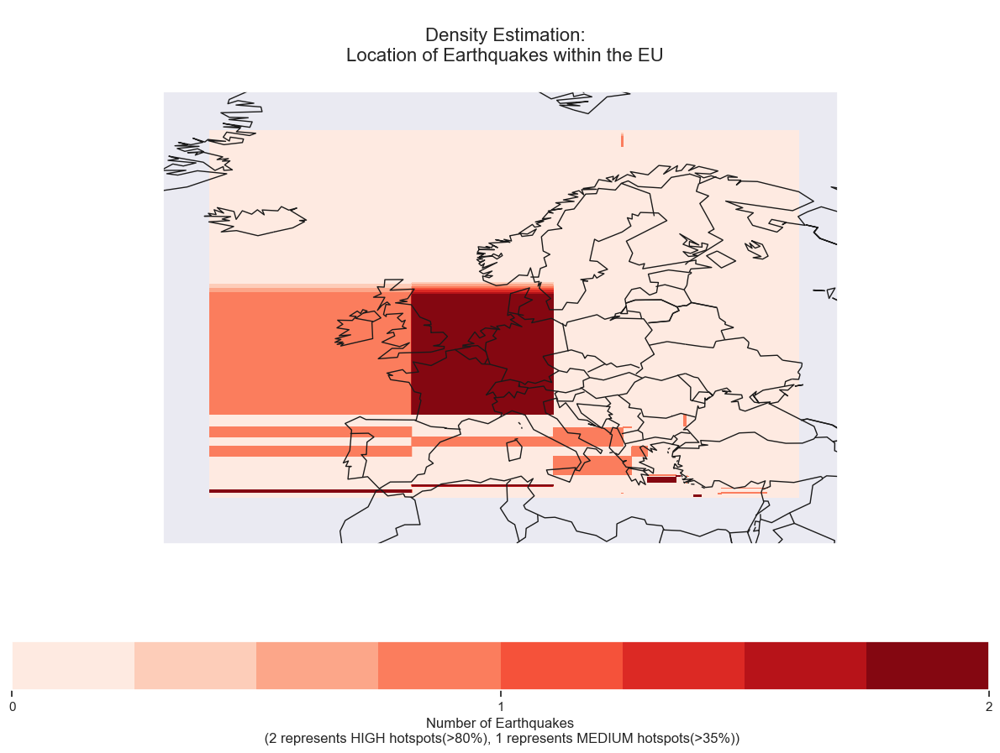

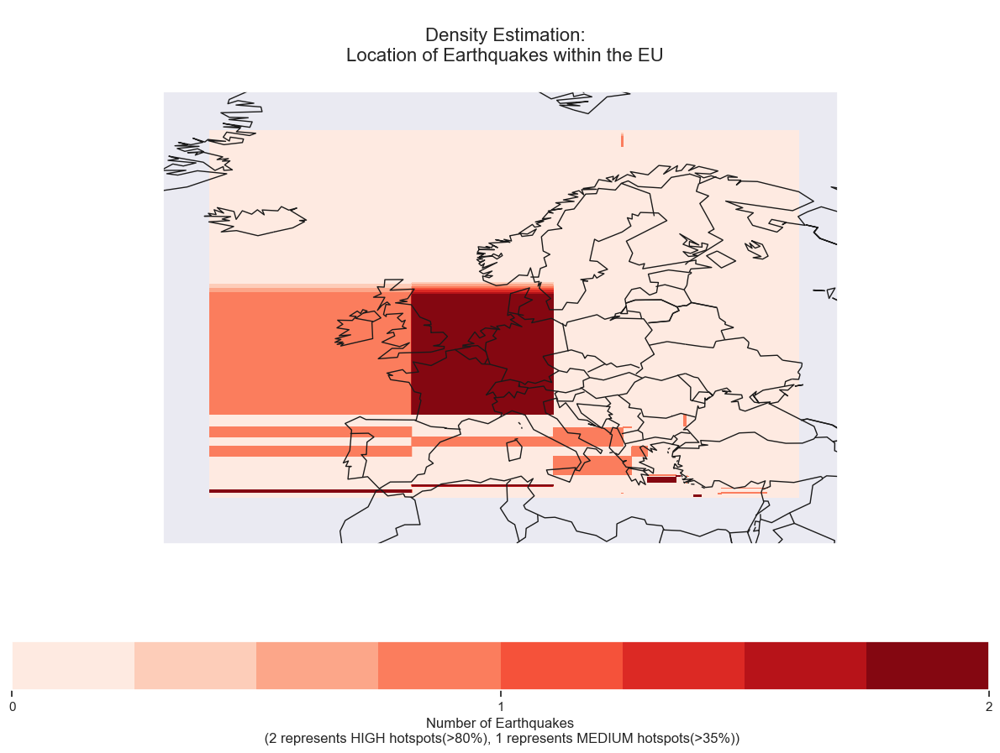

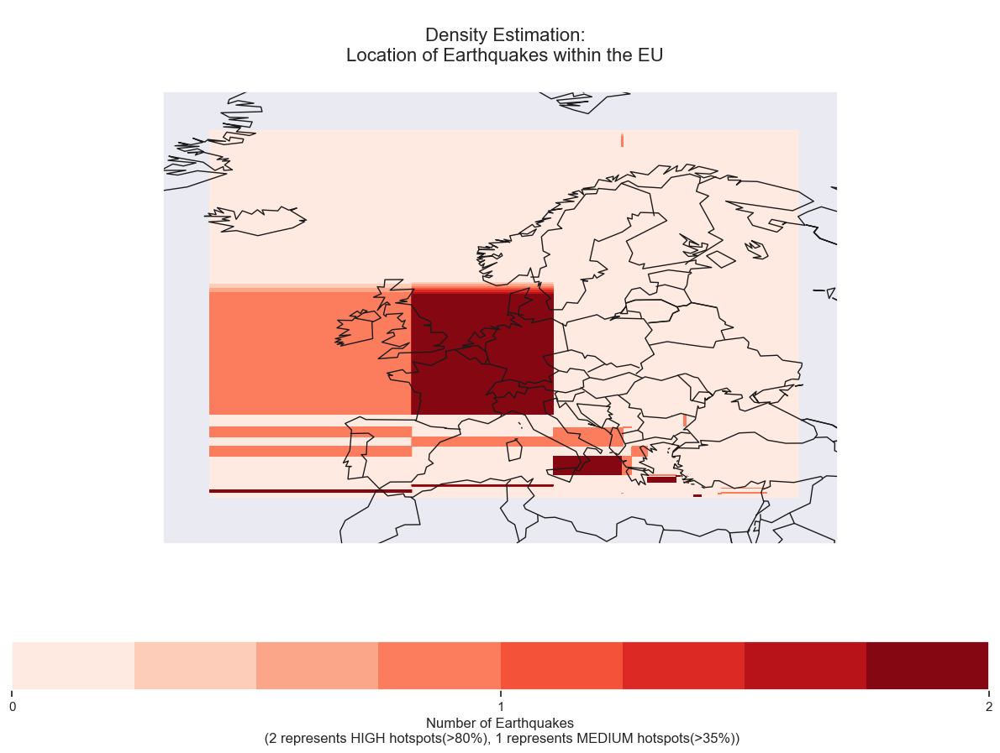

In [180]:
hotspots_eu = create_hotspots_by_batch(34,3,xlist_eu,ylist_eu,zlist_eu,all_merged_eu, min_lat_eu, max_lat_eu, min_lon_eu, max_lon_eu, "EU")

In [181]:
# filepaths
fp_in = "output_{}*.jpg".format("EU")
fp_out = "animation_{}.gif".format("EU")
jpg_pr = glob.glob(fp_in)
for i in range(10):
    swap(jpg_pr,3,34)
for i in range(10):
    swap(jpg_pr,4,34)
for i in range(4):
    swap(jpg_pr,5,34)   
    
print(jpg_pr)

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
imgs = (Image.open(f) for f in jpg_pr)

make_gif(fp_in,fp_out,imgs)

['output_EU_.jpg', 'output_EU_0.jpg', 'output_EU_1.jpg', 'output_EU_2.jpg', 'output_EU_3.jpg', 'output_EU_4.jpg', 'output_EU_5.jpg', 'output_EU_6.jpg', 'output_EU_7.jpg', 'output_EU_8.jpg', 'output_EU_9.jpg', 'output_EU_10.jpg', 'output_EU_11.jpg', 'output_EU_12.jpg', 'output_EU_13.jpg', 'output_EU_14.jpg', 'output_EU_15.jpg', 'output_EU_16.jpg', 'output_EU_17.jpg', 'output_EU_18.jpg', 'output_EU_19.jpg', 'output_EU_20.jpg', 'output_EU_21.jpg', 'output_EU_22.jpg', 'output_EU_23.jpg', 'output_EU_24.jpg', 'output_EU_25.jpg', 'output_EU_26.jpg', 'output_EU_27.jpg', 'output_EU_28.jpg', 'output_EU_29.jpg', 'output_EU_30.jpg', 'output_EU_31.jpg', 'output_EU_32.jpg', 'output_EU_33.jpg']
